# **Image Colorization Using GANs (Generative Adversarial Network)**


# Importing Libraries

In [10]:
import numpy as np
import h5py
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cv2
from tensorflow.keras.layers import Input,Dense,Reshape,Conv2D,Dropout,multiply,Dot,Concatenate,subtract,ZeroPadding2D
from tensorflow.keras.layers import BatchNormalization,LeakyReLU,Flatten
from tensorflow.keras.layers import Conv2DTranspose as Deconv2d
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# from google.colab import files
from keras import backend as K
import smtplib

from sklearn.utils import shuffle

In [12]:
import tensorflow as tf
import keras
from keras import layers
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from tqdm import tqdm
import re
from keras.preprocessing.image import img_to_array

# Uploading Dataset

In [29]:
import os
import cv2
import re
from tqdm import tqdm
from keras.preprocessing.image import img_to_array

# Function to get the files in proper order
def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)', key)]
    return sorted(data, key=alphanum_key)

# Define the size of the image
SIZE = 256
color_img = []
gray_img = []

# Path to the main folder
main_path = './'

# Process color images
color_path = os.path.join(main_path, './color/')
color_files = os.listdir(color_path)
color_files = sorted_alphanumeric(color_files)
for i in tqdm(color_files):
    if i == '2200.jpg':
        break
    else:
        img = cv2.imread(os.path.join(color_path, i), 1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        color_img.append(img_to_array(img))

# Process grayscale images
gray_path = os.path.join(main_path, './gray/')
gray_files = os.listdir(gray_path)
gray_files = sorted_alphanumeric(gray_files)
for i in tqdm(gray_files):
    if i == '2200.jpg':
        break
    else:
        img = cv2.imread(os.path.join(gray_path, i), 1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        gray_img.append(img_to_array(img))


  0%|          | 0/7129 [00:00<?, ?it/s]

 31%|███       | 2200/7129 [00:02<00:05, 895.63it/s] 


# Show Images

In [30]:
color_dataset=tf.data.Dataset.from_tensor_slices(np.array(color_img[:2000])).batch(64)
gray_dataset=tf.data.Dataset.from_tensor_slices(np.array(gray_img[:2000])).batch(64)

color_dataset_t=tf.data.Dataset.from_tensor_slices(np.array(color_img[2000:])).batch(8)
gray_dataset_t=tf.data.Dataset.from_tensor_slices(np.array(gray_img[2000:])).batch(8)

In [31]:
example_color = next(iter(color_dataset))
example_gray = next(iter(gray_dataset))

In [32]:
def plot_images(a = 4):

    for i in range(a):
        plt.figure(figsize = (10,10))
        plt.subplot(121)
        plt.title('color')
        plt.imshow(example_color[i] )

        plt.subplot(122)
        plt.title('gray')
        plt.imshow(example_gray[i])
        plt.show()

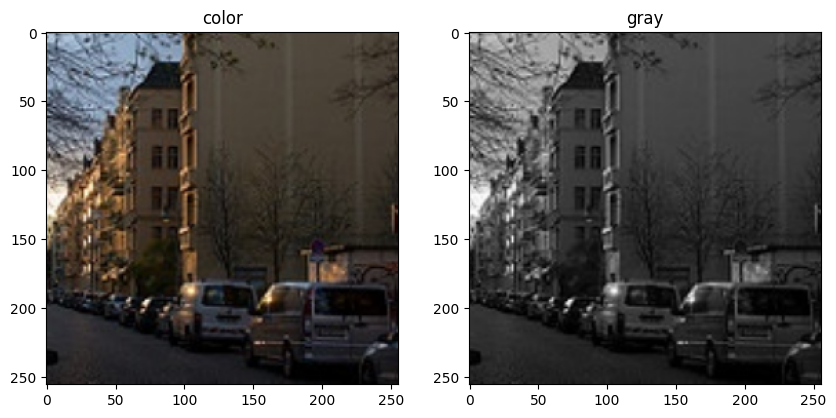

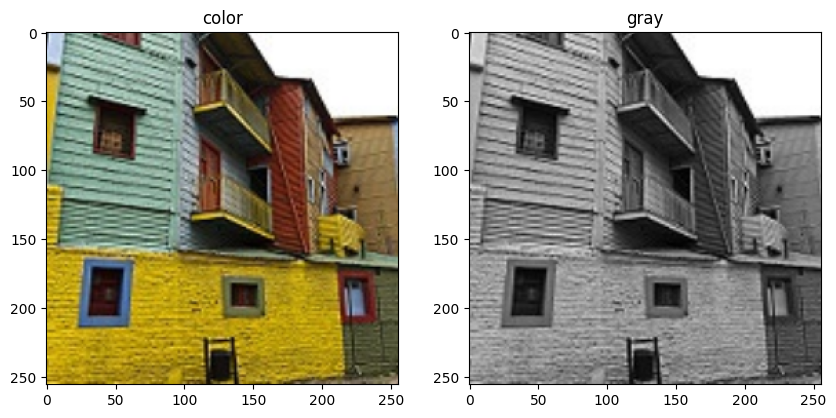

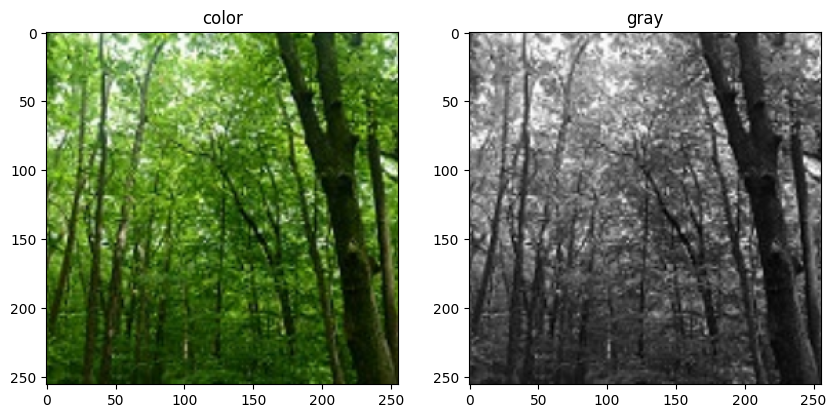

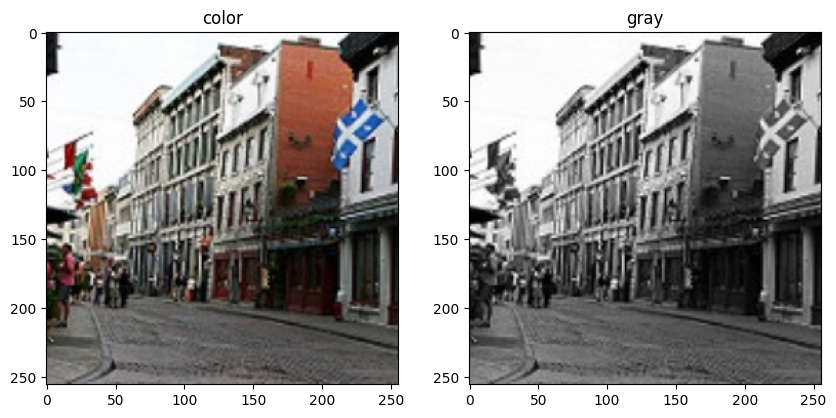

In [33]:
plot_images(4)

# Modeling

In [34]:
def downsample(filters, size, apply_batchnorm=True):

  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',kernel_initializer='he_normal', use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())
  return result

def upsample(filters, size, apply_dropout=False):

  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2,padding='same',kernel_initializer='he_normal',use_bias=False))
  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())
  return result

# Generator

In [35]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256,256,3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
    downsample(128, 4), # (bs, 64, 64, 128)
    downsample(256, 4), # (bs, 32, 32, 256)
    downsample(512, 4), # (bs, 16, 16, 512)
    downsample(512, 4), # (bs, 8, 8, 512)
    downsample(512, 4), # (bs, 4, 4, 512)
    downsample(512, 4), # (bs, 2, 2, 512)
    downsample(512, 4), # (bs, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
    upsample(512, 4), # (bs, 16, 16, 1024)
    upsample(256, 4), # (bs, 32, 32, 512)
    upsample(128, 4), # (bs, 64, 64, 256)
    upsample(64, 4), # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(3, 4,strides=2,padding='same',kernel_initializer=initializer,activation='tanh') # (bs, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

# Discriminator

In [36]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [37]:
generator = Generator()
generator.summary()



Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 sequential (Sequential)     (None, 128, 128, 64)         3072      ['input_1[0][0]']             
                                                                                                  
 sequential_1 (Sequential)   (None, 64, 64, 128)          131584    ['sequential[0][0]']          
                                                                                                  
 sequential_2 (Sequential)   (None, 32, 32, 256)          525312    ['sequential_1[0][0]']        
                                                                                            

In [38]:
discriminator = Discriminator()
discriminator.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 concatenate_7 (Concatenate  (None, 256, 256, 6)          0         ['input_image[0][0]',         
 )                                                                   'target_image[0][0]']        
                                                                                                  
 sequential_15 (Sequential)  (None, 128, 128, 64)         6144      ['concatenate_7[0][0]'] 

# Check Loss 

In [39]:
genLoss=[]
discLoss=[]

In [41]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

LAMBDA = 100

def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)
  genLoss.append(total_gen_loss)

  return total_gen_loss, gan_loss, l1_loss

def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss
  discLoss.append(total_disc_loss)

  return total_disc_loss

# Training Method

In [42]:
def train_step(input_image, target, epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

# Fitting Method

In [43]:
import time
def fit(train_ds, epochs,):
  for epoch in range(epochs):
    start = time.time()
    print("Epoch: ", epoch+1)
    # Train
    for n, (input_image, target) in train_ds.enumerate():
      train_step(input_image, target, epoch)
    print()
    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,time.time()-start))

# Generating Code

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


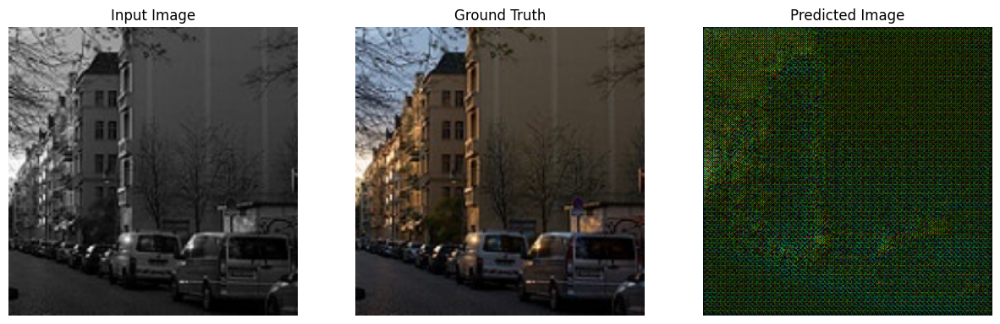

(64, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


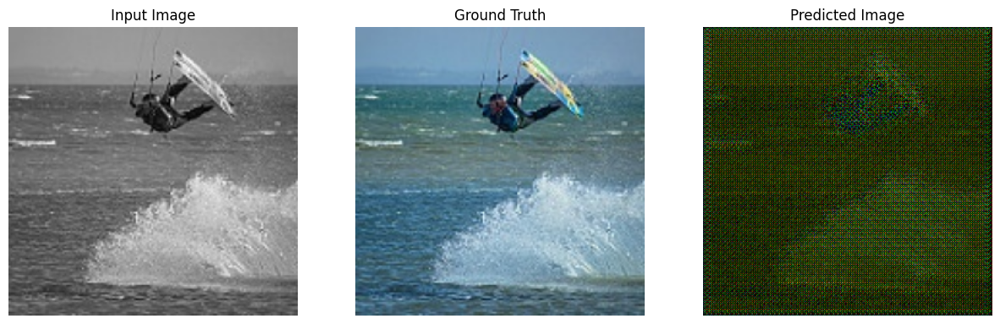

(64, 256, 256, 3)


In [44]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i])
    plt.axis('off')
  plt.show()

for example_input, example_target in tf.data.Dataset.zip((gray_dataset,color_dataset)).take(2):
  generate_images(generator, example_input, example_target)
  print(example_input.shape)

# Fitting in 50 epochs

In [47]:
hist=fit(tf.data.Dataset.zip((gray_dataset, color_dataset)), epochs = 50)

Epoch:  1

Time taken for epoch 1 is 761.594434261322 sec

Epoch:  2

Time taken for epoch 2 is 763.127194404602 sec

Epoch:  3

Time taken for epoch 3 is 786.137891292572 sec

Epoch:  4

Time taken for epoch 4 is 770.6449203491211 sec

Epoch:  5

Time taken for epoch 5 is 751.1330363750458 sec

Epoch:  6

Time taken for epoch 6 is 762.9168140888214 sec

Epoch:  7

Time taken for epoch 7 is 752.8048596382141 sec

Epoch:  8

Time taken for epoch 8 is 743.8606116771698 sec

Epoch:  9

Time taken for epoch 9 is 748.1636826992035 sec

Epoch:  10

Time taken for epoch 10 is 748.2228384017944 sec

Epoch:  11

Time taken for epoch 11 is 750.8826725482941 sec

Epoch:  12

Time taken for epoch 12 is 750.2107152938843 sec

Epoch:  13

Time taken for epoch 13 is 738.2041578292847 sec

Epoch:  14

Time taken for epoch 14 is 750.792788028717 sec

Epoch:  15

Time taken for epoch 15 is 760.748729467392 sec

Epoch:  16

Time taken for epoch 16 is 756.815399646759 sec

Epoch:  17

Time taken for epoch

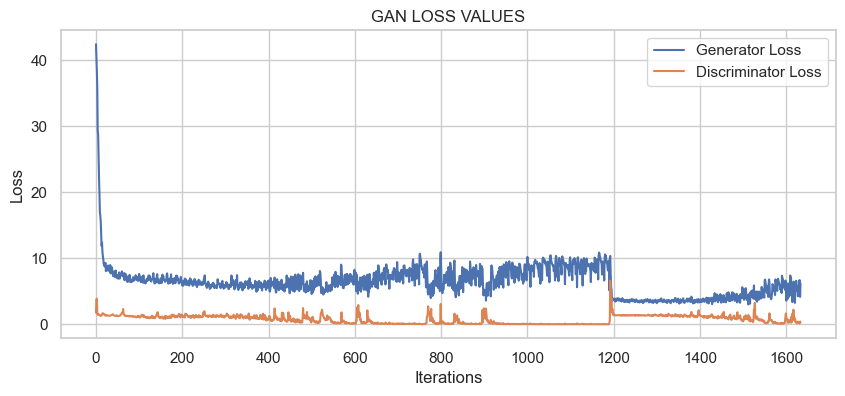

In [48]:
import seaborn as sns
sns.set(style='whitegrid')
plt.figure(figsize=(10,4))
plt.plot(genLoss, label="Generator Loss")
plt.plot(discLoss, label="Discriminator Loss")
plt.title("GAN LOSS VALUES")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Fitting with good results

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


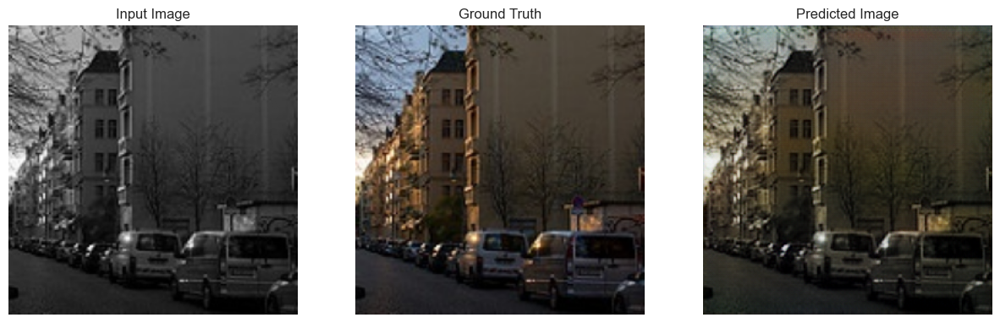

(64, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


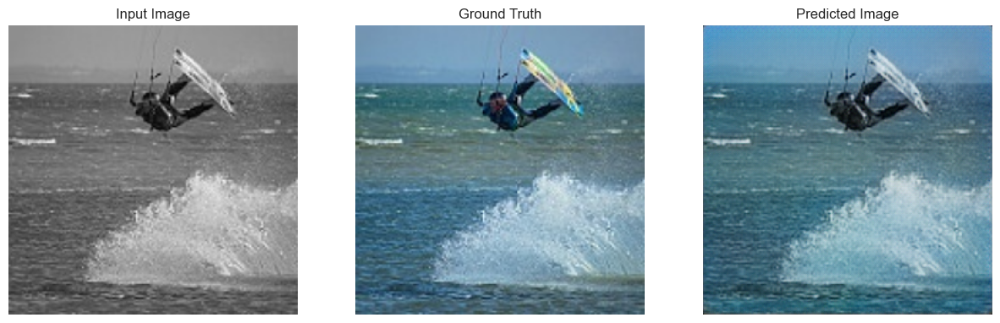

(64, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


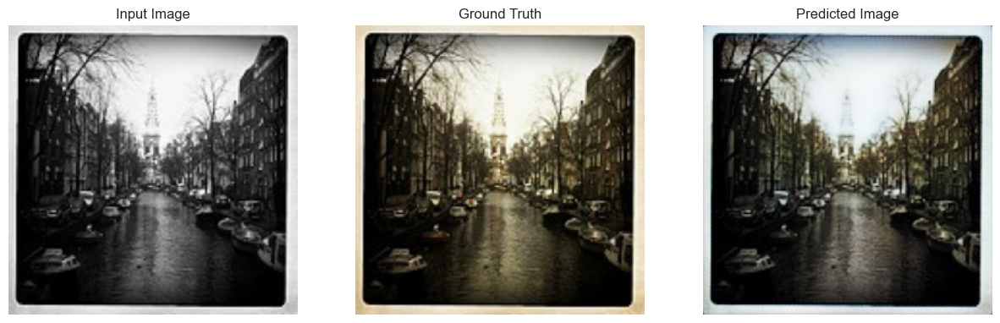

(64, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


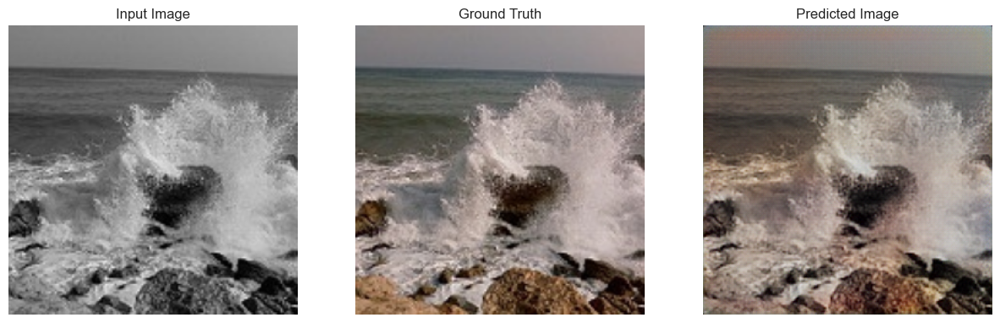

(64, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


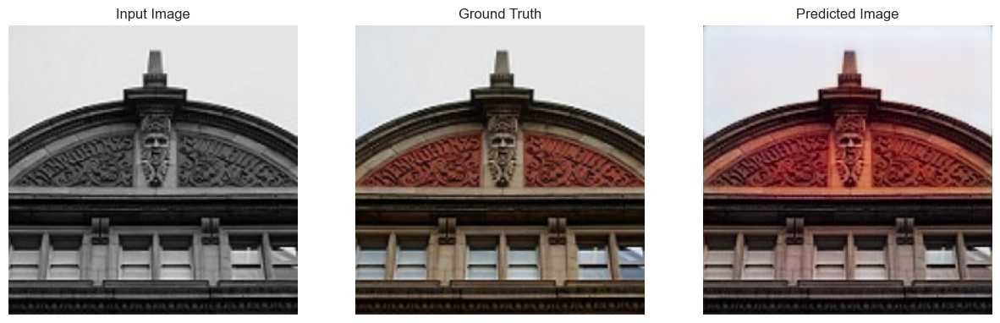

(64, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


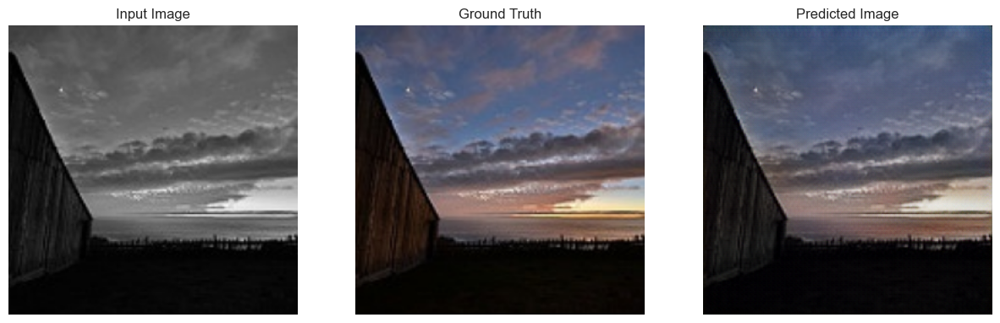

(64, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


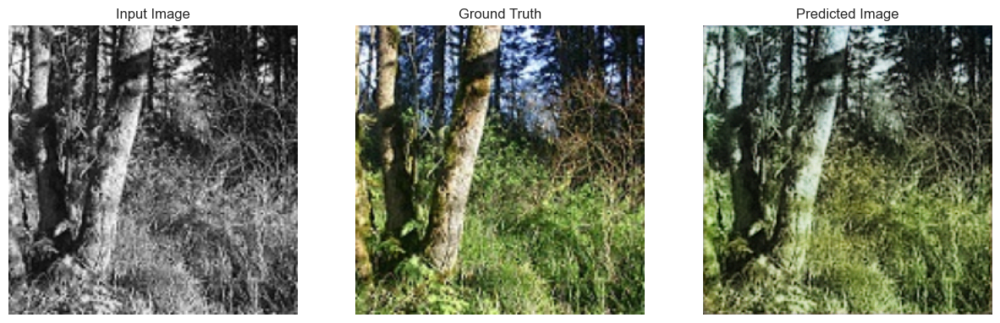

(64, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


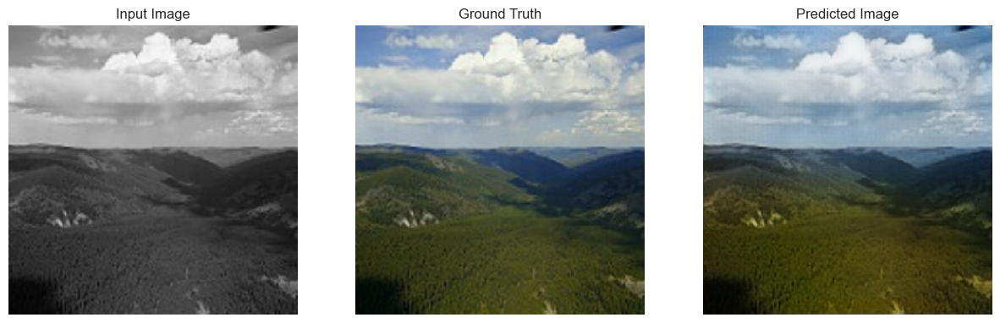

(64, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


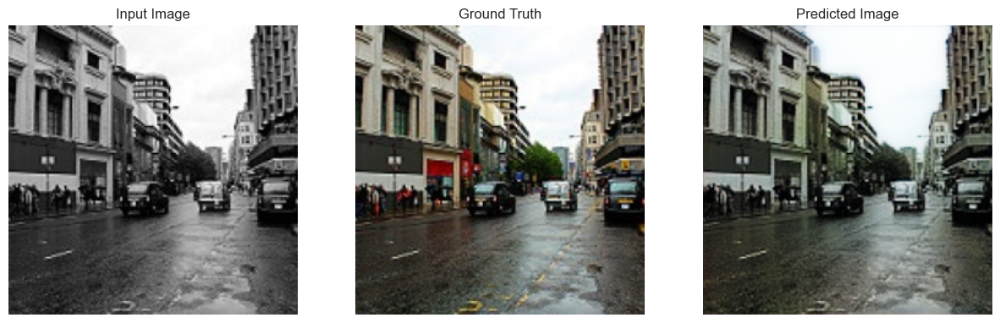

(64, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


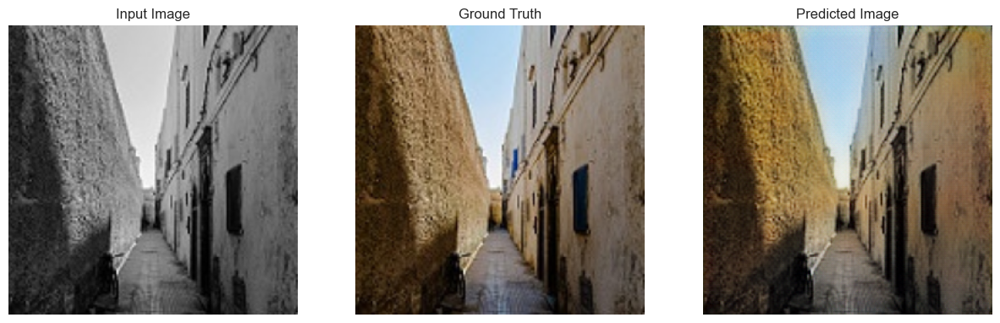

(64, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


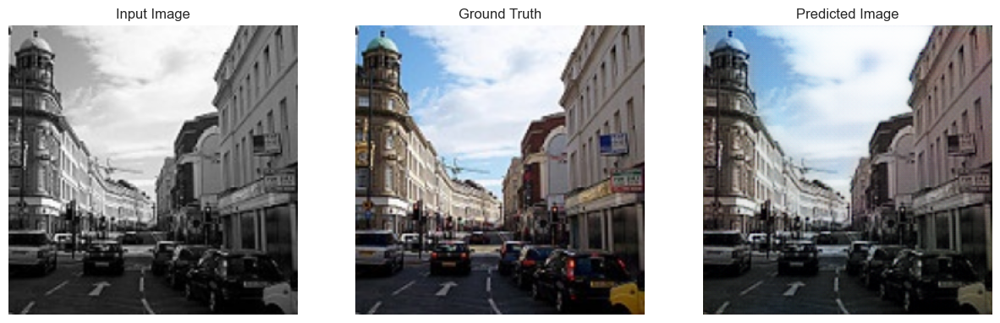

(64, 256, 256, 3)


In [49]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    print(test_input[0].shape)
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i])
    plt.axis('off')
  plt.show()

for example_input, example_target in tf.data.Dataset.zip((gray_dataset,color_dataset)).take(11):
  generate_images(generator, example_input, example_target)
  print(example_input.shape)

# Trying on new image out of Datasets

In [115]:
img2 = cv2.imread("./data/test_black/image5429.jpg").astype("float32")
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
# img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
try:
    img2 = img2.reshape(1,SIZE,SIZE,3)
except:
    img2 = cv2.resize(img2,(SIZE,SIZE))
    img2 = img2.reshape(1,SIZE,SIZE,3)

In [116]:
img2 = img2.reshape(1, SIZE, SIZE, 3)

In [117]:
img2.shape

(1, 256, 256, 3)

In [118]:
img2

array([[[[ 93.24805 ,  93.24805 ,  93.24805 ],
         [ 96.6875  ,  96.6875  ,  96.6875  ],
         [ 95.61426 ,  95.61426 ,  95.61426 ],
         ...,
         [149.76074 , 149.76074 , 149.76074 ],
         [146.02441 , 146.02441 , 146.02441 ],
         [163.7373  , 163.7373  , 163.7373  ]],

        [[ 97.418945,  97.418945,  97.418945],
         [ 97.08301 ,  97.08301 ,  97.08301 ],
         [ 95.1875  ,  95.1875  ,  95.1875  ],
         ...,
         [130.34375 , 130.34375 , 130.34375 ],
         [130.0039  , 130.0039  , 130.0039  ],
         [137.86133 , 137.86133 , 137.86133 ]],

        [[ 97.48926 ,  97.48926 ,  97.48926 ],
         [ 98.4668  ,  98.4668  ,  98.4668  ],
         [ 97.33008 ,  97.33008 ,  97.33008 ],
         ...,
         [108.87109 , 108.87109 , 108.87109 ],
         [109.52734 , 109.52734 , 109.52734 ],
         [109.740234, 109.740234, 109.740234]],

        ...,

        [[131.74023 , 131.74023 , 131.74023 ],
         [126.28418 , 126.28418 , 126.28418 ]

In [119]:
img2[0] = img2[0]/255.0

In [120]:
img2

array([[[[0.3656786 , 0.3656786 , 0.3656786 ],
         [0.37916666, 0.37916666, 0.37916666],
         [0.37495786, 0.37495786, 0.37495786],
         ...,
         [0.587297  , 0.587297  , 0.587297  ],
         [0.57264477, 0.57264477, 0.57264477],
         [0.64210707, 0.64210707, 0.64210707]],

        [[0.38203508, 0.38203508, 0.38203508],
         [0.38071766, 0.38071766, 0.38071766],
         [0.3732843 , 0.3732843 , 0.3732843 ],
         ...,
         [0.51115197, 0.51115197, 0.51115197],
         [0.50981927, 0.50981927, 0.50981927],
         [0.54063267, 0.54063267, 0.54063267]],

        [[0.3823108 , 0.3823108 , 0.3823108 ],
         [0.3861443 , 0.3861443 , 0.3861443 ],
         [0.38168657, 0.38168657, 0.38168657],
         ...,
         [0.42694548, 0.42694548, 0.42694548],
         [0.429519  , 0.429519  , 0.429519  ],
         [0.43035385, 0.43035385, 0.43035385]],

        ...,

        [[0.5166284 , 0.5166284 , 0.5166284 ],
         [0.49523208, 0.49523208, 0.49523208]

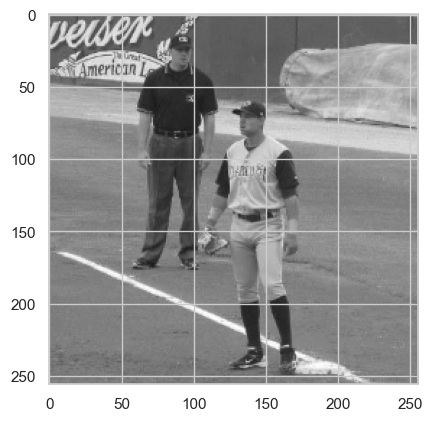

In [121]:
plt.imshow(img2[0])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


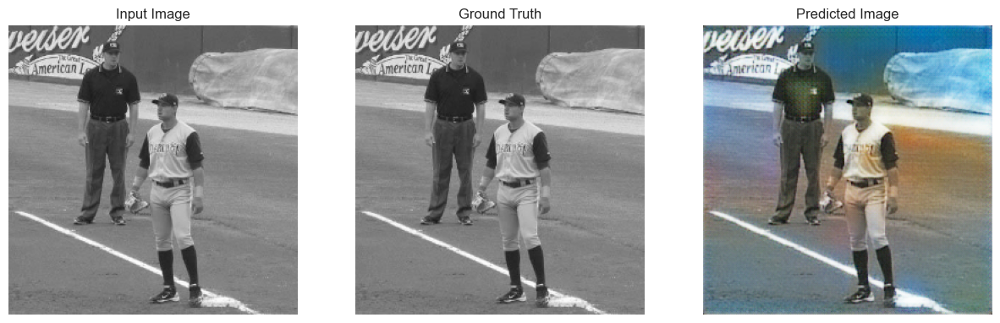

In [122]:
Pred=generate_images(generator,img2, img2)

This is the image after Colorizing

# Saving and Load Model

In [59]:
model_Generator_json=generator.to_json()
model_discriminator_json=discriminator.to_json()


c:\Users\alsaf\Downloads\Image_Colorization-main\env\Lib\site-packages\keras\src\initializers\__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(


In [60]:
with open('modelGenerator.json','w') as json_file:
  json_file.write(model_Generator_json)
generator.save_weights('modelGen.h5')
print('saved model to disk')


saved model to disk


In [61]:
with open('modelDescriminator.json','w') as json_file:
  json_file.write(model_discriminator_json)
generator.save_weights('modelDis.h5')
print('saved model  Dis to disk')

saved model  Dis to disk


In [62]:
from tensorflow.keras.models import model_from_json
json_file = open('modelGenerator.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
loaded_model.load_weights("modelGen.h5")
print("Loaded model from disk")

loaded_model.compile(loss='binary_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

Loaded model from disk

